In [1]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
path = "/content/drive/My Drive/CompVis_Project/pygoturn-master"
import sys
sys.path.append(path)

In [0]:
import os
import argparse

import torch
import cv2

from src.test import GOTURN

import pickle
import shutil
import matplotlib.pyplot as plt
from skimage.measure import regionprops
import numpy as np
import glob
from skimage import io

In [0]:
def axis_aligned_iou(boxA, boxB):
    # make sure that x1,y1,x2,y2 of a box are valid
    assert(boxA[0] <= boxA[2])
    assert(boxA[1] <= boxA[3])
    assert(boxB[0] <= boxB[2])
    assert(boxB[1] <= boxB[3])

    # determine the (x, y)-coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    # compute the area of intersection rectangle
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)

    # compute the area of both the prediction and ground-truth
    # rectangles
    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)

    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = interArea / float(boxAArea + boxBArea - interArea)

    # return the intersection over union value
    return iou


def save(im, bb, gt_bb, idx,name,path_out):
        
    im = cv2.cvtColor(im, cv2.COLOR_RGB2BGR)
    bb = [int(val) for val in bb]  # GOTURN output
    gt_bb = [int(val) for val in gt_bb]  # groundtruth box
    # plot GOTURN predictions with red rectangle
    im = cv2.rectangle(im, (bb[0], bb[1]), (bb[2], bb[3]),
                       (0, 0, 255), 2)
    # plot annotations with white rectangle
    im = cv2.rectangle(im, (gt_bb[0], gt_bb[1]), (gt_bb[2], gt_bb[3]),
                       (255, 255, 255), 2)
    save_path = os.path.join(path_out+name+'/', str(idx)+'.jpg')
    cv2.imwrite(save_path, im)

def getPredictions(path_in, path_out, model_weights, names,kContextFactor=2, kScaleFactor=10):
    iou_d = {}
    centroid_est = {}
    for n in names :
        print(n)
        cuda = torch.cuda.is_available()
        device = torch.device('cuda:0' if cuda else 'cpu')
        tester = GOTURN(path_in+n,
                        model_weights,
                        device,kContextFactor=kContextFactor,kScaleFactor=kScaleFactor)

        if os.path.exists(path_out+n):
            print('Save directory %s already exists' % (path_out+n))
            shutil.rmtree(path_out+n)
            os.makedirs(path_out+n)
            os.makedirs(path_out+n+'/boxes/')
            os.makedirs(path_out+n+'/centroids/')
            os.makedirs(path_out+n+'/IoU/')
        else:
            os.makedirs(path_out+n)
            os.makedirs(path_out+n+'/boxes/')
            os.makedirs(path_out+n+'/centroids/')
            os.makedirs(path_out+n+'/IoU/')
        # save initial frame with bounding box
        save(tester.img[0][0], tester.prev_rect, tester.prev_rect, 1,n,path_out)
        tester.model.eval()
        iou_list = []
        cent_list = []
        # loop through sequence images
        for i in range(tester.len):
            
            # get torch input tensor
            sample = tester[i]

            # predict box
            bb = tester.get_rect(sample)
            
            f= open(path_out+n+'/boxes/pred_rect.txt','a')
            w=bb[2]-bb[0]
            h=bb[3]-bb[1]
            l = str(bb[0])+','+str(bb[1])+','+str(w)+','+str(h)+'\n'
            f.writelines(l)
            f.close() 
            
            cen_x = bb[0] + w/2
            cen_y = bb[1] + h/2
            
            gt_bb = tester.gt[i]
            tester.prev_rect = bb

            # save current image with predicted rectangle and gt box
            im = tester.img[i][1]
            save(im, bb, gt_bb, i+2,n,path_out)

            # print stats
            print('frame: %d, IoU = %f' % (
                i+2, axis_aligned_iou(gt_bb, bb)))
            iou_list.append(axis_aligned_iou(gt_bb, bb))
            cent_list.append([cen_x,cen_y])
        iou_d[n] = iou_list
        centroid_est[n] = cent_list

    pickle_iou = open(path_out+"iou_dict.pickle","wb")
    pickle.dump(iou_d, pickle_iou)
    pickle_iou.close()
                  
    pickle_cent = open(path_out+"cent_dict.pickle","wb")
    pickle.dump(centroid_est, pickle_cent)
    pickle_cent.close()

def centroid_assessment(groundtruth,estimated):
    return np.linalg.norm(np.array(groundtruth)-np.array(estimated))

# ***Testing a pretrained model on the training sequences***

In [0]:
names = ['bear','camel','book','rhino','swan','bag']
path_in = path+"/data/OTB/"
path_out = path+"/results/pretrained_default/"
model_weights = path+"/model/pytorch_goturn.pth.tar"


getPredictions(path_in,path_out,model_weights,names)

bear
[ 49. 108. 231. 216.]
Save directory /content/drive/My Drive/CompVis_Project/pygoturn-master/results/pretrainedModel_trainSeq/bear already exists
frame: 2, IoU = 0.976422
frame: 3, IoU = 0.955246
frame: 4, IoU = 0.957776
frame: 5, IoU = 0.902284
frame: 6, IoU = 0.882083
frame: 7, IoU = 0.883121
frame: 8, IoU = 0.894090
frame: 9, IoU = 0.900023
frame: 10, IoU = 0.894163
frame: 11, IoU = 0.913221
frame: 12, IoU = 0.873635
frame: 13, IoU = 0.885149
frame: 14, IoU = 0.898543
frame: 15, IoU = 0.923238
frame: 16, IoU = 0.964561
frame: 17, IoU = 0.967516
frame: 18, IoU = 0.960388
frame: 19, IoU = 0.967072
frame: 20, IoU = 0.928730
frame: 21, IoU = 0.902075
frame: 22, IoU = 0.897315
frame: 23, IoU = 0.877682
frame: 24, IoU = 0.901748
frame: 25, IoU = 0.919592
frame: 26, IoU = 0.881644
camel
[132.  44. 353. 214.]
frame: 2, IoU = 0.975832
frame: 3, IoU = 0.910800
frame: 4, IoU = 0.864475
frame: 5, IoU = 0.888440
frame: 6, IoU = 0.852764
frame: 7, IoU = 0.840142
frame: 8, IoU = 0.829649
fram

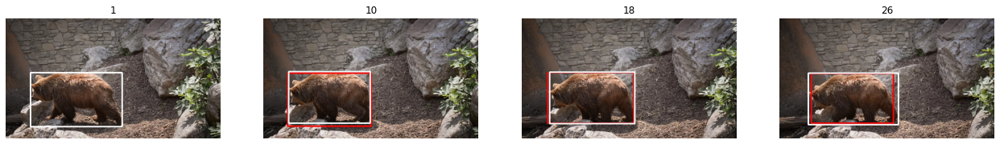

In [0]:
## GOTURN predictions with red rectangle
## Annotations with white rectangle
from skimage import io
plt.figure(figsize=(22, 6))
name = 'bear'
for idx, im in enumerate([1,10,18,26]):
    img_current = io.imread(path_out+name+'/%0*d.jpg'%(0,im))
    plt.subplot(1,4,idx+1), plt.title('%i' %(im)), plt.imshow(img_current), plt.xticks([]), plt.yticks([])
    plt.axis('off')
plt.show()

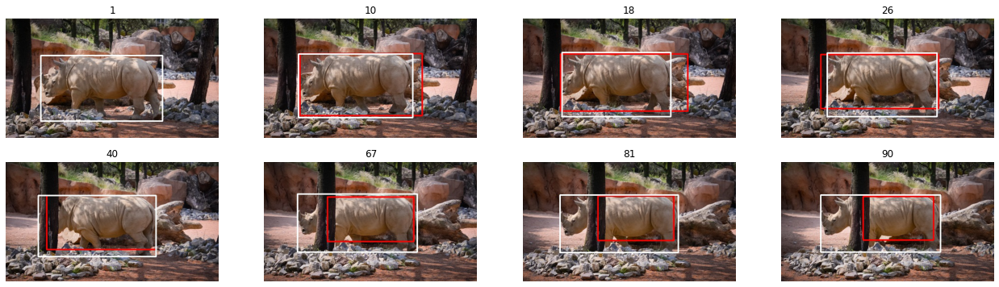

In [0]:
plt.figure(figsize=(22, 6))
name = 'rhino'
for idx, im in enumerate([1,10,18,26,40,67,81,90]):
    img_current = io.imread(path+"/result/"+name+'/%0*d.jpg'%(0,im))
    plt.subplot(2,4,idx+1), plt.title('%i' %(im)), plt.imshow(img_current), plt.xticks([]), plt.yticks([])
    plt.axis('off')
plt.show()

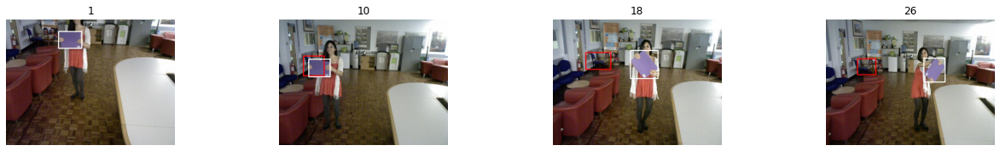

In [0]:
plt.figure(figsize=(22, 6))
name = 'book'
for idx, im in enumerate([1,10,18,26]):
    img_current = io.imread(path_out+name+'/%0*d.jpg'%(0,im))
    plt.subplot(2,4,idx+1), plt.title('%i' %(im)), plt.imshow(img_current), plt.xticks([]), plt.yticks([])
    plt.axis('off')
plt.show()

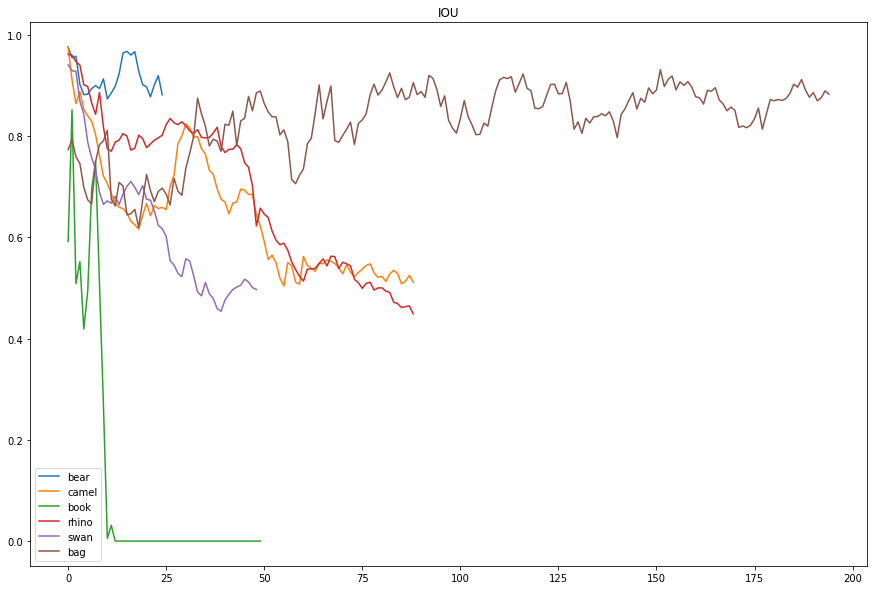

In [0]:
# IOU score
plt.figure(figsize = (15,10))
pickle_in = open(path_out+'iou_dict.pickle',"rb")
iou_score = pickle.load(pickle_in)
for n in names:
    iou_name = iou_score[n]
    plt.plot(iou_name, label = n)
plt.legend()
plt.title('IOU')
plt.show()

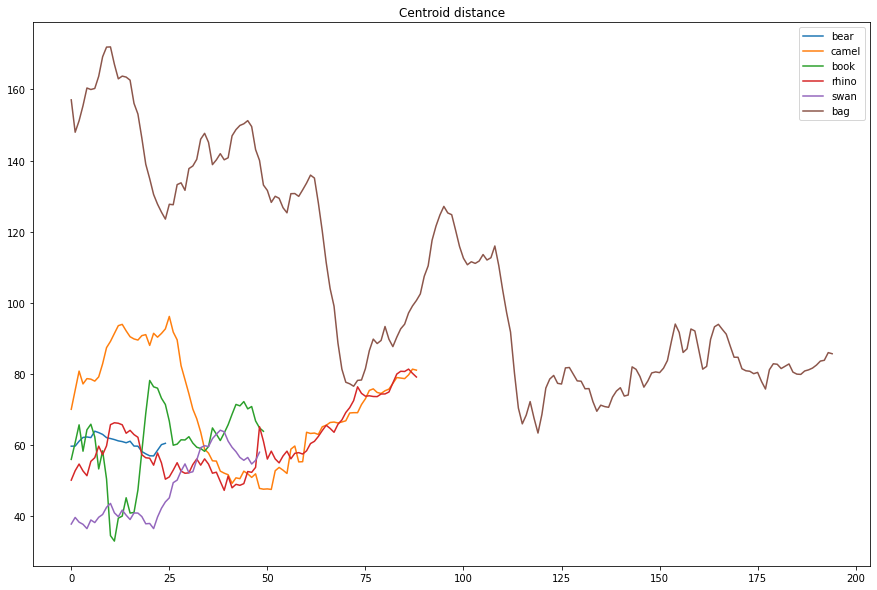

In [0]:
# Centroid distance
plt.figure(figsize = (15,10))
pickle_in = open(path_out+'cent_dict.pickle',"rb")
centroid_esti = pickle.load(pickle_in)
for n in names:
    gt_coords = open(path_in+n+'/groundtruth_rect.txt', "r")
    coords = gt_coords.readline().split(',')
    centroid_name = centroid_esti[n]
    dist = []
    for idx in range(len(centroid_name)):
        coords = gt_coords.readline().split(',')
        cenx = int(coords[0]) + (int(coords[2]) -int(coords[0]))/2
        ceny = int(coords[1]) + (int(coords[3]) -int(coords[1]))/2
        centroid_gt = [cenx,ceny]
        dist.append(centroid_assessment(centroid_gt,centroid_name[idx]))
    plt.plot(dist, label = n)
plt.legend()
plt.title('Centroid distance')
plt.show()

**Conclusions :** 

The pretrained model prefoms well on some sequences :


*   Bag : This is might be because of the difference between bag and the background
*   Bear : simple movement

For other sequences, it performs poorly: 


*   Book : large movements + change of scale
*   Swan : large movements





# **Pretrained model : changing the context factor**

In [0]:

names = ['bear','camel','book','rhino','swan','bag']
path_in = path+"/data/OTB/"
path_out = path+"/results/pretrained_context3/"
model_weights = path+"/model/pytorch_goturn.pth.tar"


getPredictions(path_in,path_out,model_weights,names,kContextFactor=3, kScaleFactor=10)

bear
[ 49. 108. 231. 216.]
Save directory /content/drive/My Drive/CompVis_Project/pygoturn-master/results/pretrained_context3/bear already exists
frame: 2, IoU = 0.462944
frame: 3, IoU = 0.309708
frame: 4, IoU = 0.202618
frame: 5, IoU = 0.175088
frame: 6, IoU = 0.169388
frame: 7, IoU = 0.163765
frame: 8, IoU = 0.162766
frame: 9, IoU = 0.162766
frame: 10, IoU = 0.164346
frame: 11, IoU = 0.165355
frame: 12, IoU = 0.165355
frame: 13, IoU = 0.166363
frame: 14, IoU = 0.167371
frame: 15, IoU = 0.169388
frame: 16, IoU = 0.167759
frame: 17, IoU = 0.168758
frame: 18, IoU = 0.171404
frame: 19, IoU = 0.171753
frame: 20, IoU = 0.172752
frame: 21, IoU = 0.174749
frame: 22, IoU = 0.175747
frame: 23, IoU = 0.176746
frame: 24, IoU = 0.175030
frame: 25, IoU = 0.175272
frame: 26, IoU = 0.181487
camel
[132.  44. 353. 214.]
Save directory /content/drive/My Drive/CompVis_Project/pygoturn-master/results/pretrained_context3/camel already exists
frame: 2, IoU = 0.503206
frame: 3, IoU = 0.380794
frame: 4, IoU 

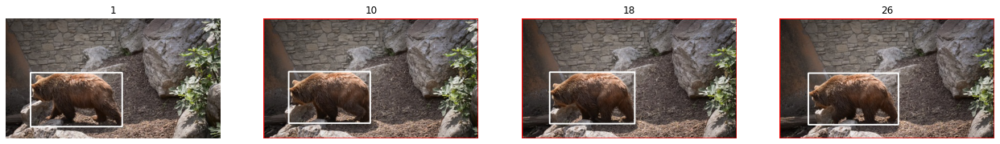

In [0]:
## GOTURN predictions with red rectangle
## Annotations with white rectangle
plt.figure(figsize=(22, 6))
name = 'bear'
for idx, im in enumerate([1,10,18,26]):
    img_current = io.imread(path_out+name+'/%0*d.jpg'%(0,im))
    plt.subplot(1,4,idx+1), plt.title('%i' %(im)), plt.imshow(img_current), plt.xticks([]), plt.yticks([])
    plt.axis('off')
plt.show()

When we increased the context factor, the predicted bounding box correspond to the whole image. This is due to the fact that the weights of the pretrained model was learned for a given factor. 

In the next part, we try to increase the factor slightly.






In [0]:
names = ['bear','camel','book','rhino','swan','bag']
path_in = path+"/data/OTB/"
path_out = path+"/results/pretrained_context01/"
model_weights = path+"/model/pytorch_goturn.pth.tar"


getPredictions(path_in,path_out,model_weights,names,kContextFactor=2.01, kScaleFactor=10)

bear
[ 49. 108. 231. 216.]
frame: 2, IoU = 0.976154
frame: 3, IoU = 0.964734
frame: 4, IoU = 0.911993
frame: 5, IoU = 0.873683
frame: 6, IoU = 0.862792
frame: 7, IoU = 0.811533
frame: 8, IoU = 0.812462
frame: 9, IoU = 0.811097
frame: 10, IoU = 0.833082
frame: 11, IoU = 0.834275
frame: 12, IoU = 0.827442
frame: 13, IoU = 0.834963
frame: 14, IoU = 0.835514
frame: 15, IoU = 0.862394
frame: 16, IoU = 0.876786
frame: 17, IoU = 0.903187
frame: 18, IoU = 0.896405
frame: 19, IoU = 0.891609
frame: 20, IoU = 0.902795
frame: 21, IoU = 0.902956
frame: 22, IoU = 0.905516
frame: 23, IoU = 0.912086
frame: 24, IoU = 0.906789
frame: 25, IoU = 0.876447
frame: 26, IoU = 0.894770
camel
[132.  44. 353. 214.]
frame: 2, IoU = 0.955005
frame: 3, IoU = 0.921455
frame: 4, IoU = 0.875155
frame: 5, IoU = 0.870999
frame: 6, IoU = 0.888971
frame: 7, IoU = 0.883295
frame: 8, IoU = 0.843950
frame: 9, IoU = 0.820661
frame: 10, IoU = 0.729731
frame: 11, IoU = 0.706708
frame: 12, IoU = 0.689345
frame: 13, IoU = 0.653935

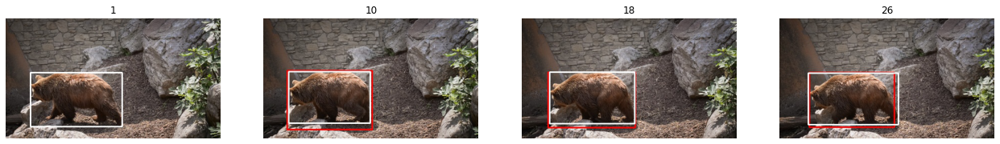

In [0]:
## GOTURN predictions with red rectangle
## Annotations with white rectangle
from skimage import io
plt.figure(figsize=(22, 6))
name = 'bear'
for idx, im in enumerate([1,10,18,26]):
    img_current = io.imread(path_out+name+'/%0*d.jpg'%(0,im))
    plt.subplot(1,4,idx+1), plt.title('%i' %(im)), plt.imshow(img_current), plt.xticks([]), plt.yticks([])
    plt.axis('off')
plt.show()

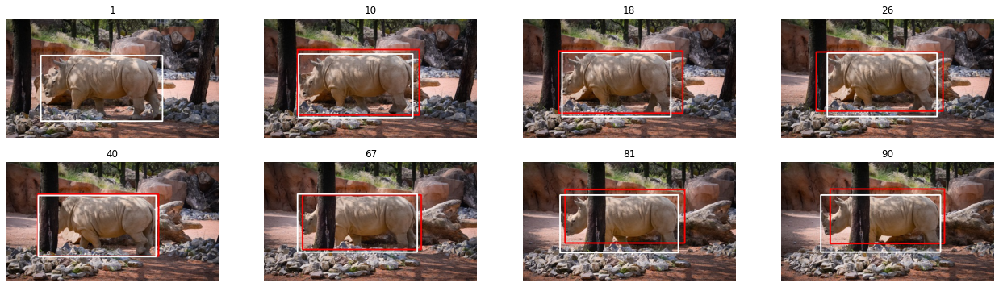

In [0]:
plt.figure(figsize=(22, 6))
name = 'rhino'
for idx, im in enumerate([1,10,18,26,40,67,81,90]):
    img_current = io.imread(path_out+name+'/%0*d.jpg'%(0,im))
    plt.subplot(2,4,idx+1), plt.title('%i' %(im)), plt.imshow(img_current), plt.xticks([]), plt.yticks([])
    plt.axis('off')
plt.show()

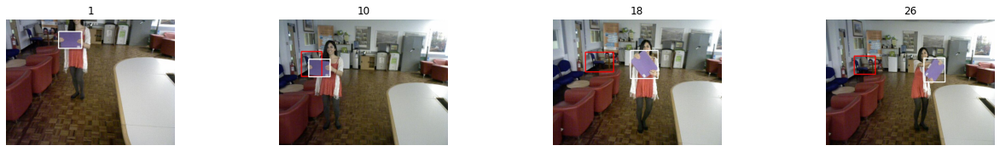

In [0]:
plt.figure(figsize=(22, 6))
name = 'book'
for idx, im in enumerate([1,10,18,26]):
    img_current = io.imread(path_out+name+'/%0*d.jpg'%(0,im))
    plt.subplot(2,4,idx+1), plt.title('%i' %(im)), plt.imshow(img_current), plt.xticks([]), plt.yticks([])
    plt.axis('off')
plt.show()

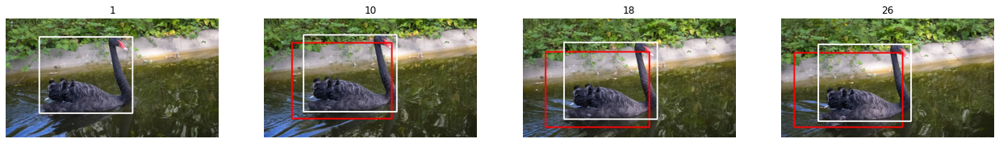

In [0]:
plt.figure(figsize=(22, 6))
name = 'swan'
for idx, im in enumerate([1,10,18,26]):
    img_current = io.imread(path_out+name+'/%0*d.jpg'%(0,im))
    plt.subplot(2,4,idx+1), plt.title('%i' %(im)), plt.imshow(img_current), plt.xticks([]), plt.yticks([])
    plt.axis('off')
plt.show()

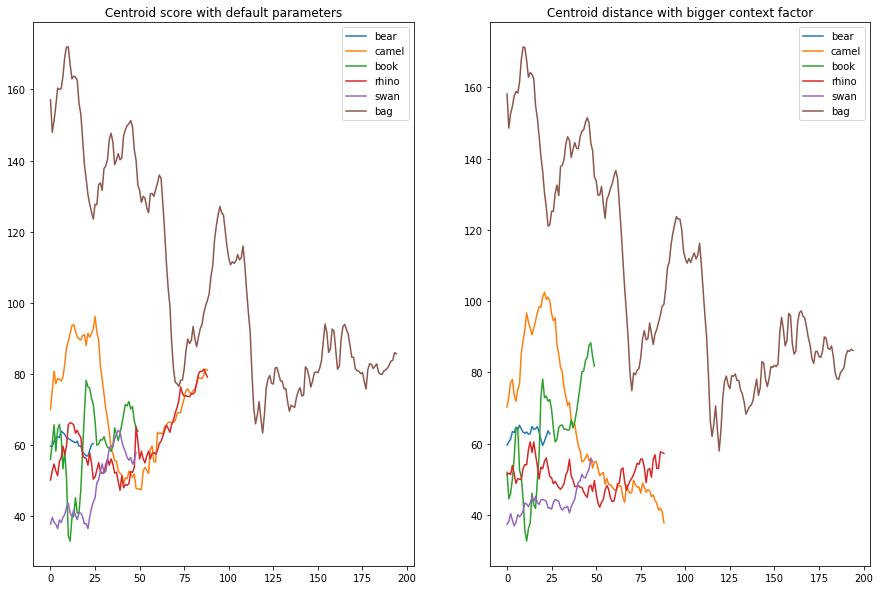

In [0]:
plt.figure(figsize = (15,10))
plt.subplot(121)
pickle_in = open(path+'/results/pretrained_default/cent_dict.pickle',"rb")
centroid_esti = pickle.load(pickle_in)
for n in names:
    gt_coords = open(path_in+n+'/groundtruth_rect.txt', "r")
    coords = gt_coords.readline().split(',')
    centroid_name = centroid_esti[n]
    dist = []
    for idx in range(len(centroid_name)):
        coords = gt_coords.readline().split(',')
        cenx = int(coords[0]) + (int(coords[2]) -int(coords[0]))/2
        ceny = int(coords[1]) + (int(coords[3]) -int(coords[1]))/2
        centroid_gt = [cenx,ceny]
        dist.append(centroid_assessment(centroid_gt,centroid_name[idx]))
    plt.plot(dist, label = n)
plt.legend()
plt.title("Centroid score with default parameters")

plt.subplot(122)
pickle_in = open(path_out+'/cent_dict.pickle',"rb")
centroid_esti = pickle.load(pickle_in)
for n in names:
    gt_coords = open(path_in+n+'/groundtruth_rect.txt', "r")
    coords = gt_coords.readline().split(',')
    centroid_name = centroid_esti[n]
    dist = []
    for idx in range(len(centroid_name)):
        coords = gt_coords.readline().split(',')
        cenx = int(coords[0]) + (int(coords[2]) -int(coords[0]))/2
        ceny = int(coords[1]) + (int(coords[3]) -int(coords[1]))/2
        centroid_gt = [cenx,ceny]
        dist.append(centroid_assessment(centroid_gt,centroid_name[idx]))
    plt.plot(dist, label = n)
plt.legend()
plt.title("Centroid distance with bigger context factor")
plt.show()

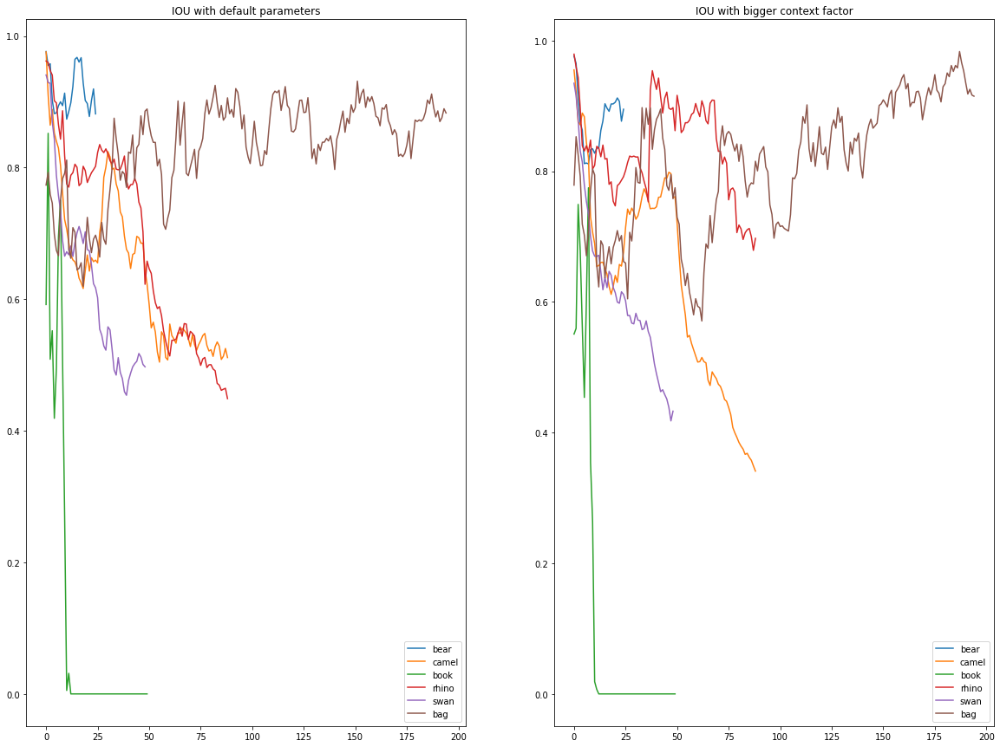

In [0]:
plt.figure(figsize = (20,15))
pickle_in = open(path+'/results/pretrained_default/iou_dict.pickle',"rb")
iou_score = pickle.load(pickle_in)
plt.subplot(121)
for n in names:
    iou_name = iou_score[n]
    plt.plot(iou_name, label = n)
plt.legend()
plt.title('IOU with default parameters')

plt.subplot(122)
pickle_in = open(path_out+'iou_dict.pickle',"rb")
iou_score = pickle.load(pickle_in)
for n in names:
    iou_name = iou_score[n]
    plt.plot(iou_name, label = n)
plt.legend()
plt.title('IOU with bigger context factor')
plt.show()


**Conclusions :** When we increase slightly the context factor, the predicted bonding boxes become larger. This way we improve the results in the presence of occlusion as we can see in the case of "rhino" images. But, it does not solve the problem of large motion as we can see in the case of "book" images.

# **Pretrained model : changing the scale factor**

In [0]:
names = ['bear','camel','book','rhino','swan','bag']
path_in = path+"/data/OTB/"
path_out = path+"/results/pretrained_scale05/"
model_weights = path+"/model/pytorch_goturn.pth.tar"

getPredictions(path_in,path_out,model_weights,names,kContextFactor=2, kScaleFactor=9.95)

bear
[ 49. 108. 231. 216.]
frame: 2, IoU = 0.971595
frame: 3, IoU = 0.944718
frame: 4, IoU = 0.930636
frame: 5, IoU = 0.863017
frame: 6, IoU = 0.814444
frame: 7, IoU = 0.808186
frame: 8, IoU = 0.790275
frame: 9, IoU = 0.789333
frame: 10, IoU = 0.802432
frame: 11, IoU = 0.784767
frame: 12, IoU = 0.797341
frame: 13, IoU = 0.829155
frame: 14, IoU = 0.841819
frame: 15, IoU = 0.845120
frame: 16, IoU = 0.838376
frame: 17, IoU = 0.815708
frame: 18, IoU = 0.855597
frame: 19, IoU = 0.861366
frame: 20, IoU = 0.850558
frame: 21, IoU = 0.844503
frame: 22, IoU = 0.843105
frame: 23, IoU = 0.842252
frame: 24, IoU = 0.831458
frame: 25, IoU = 0.828999
frame: 26, IoU = 0.844414
camel
[132.  44. 353. 214.]
frame: 2, IoU = 0.961457
frame: 3, IoU = 0.887978
frame: 4, IoU = 0.907074
frame: 5, IoU = 0.874350
frame: 6, IoU = 0.848450
frame: 7, IoU = 0.848870
frame: 8, IoU = 0.818727
frame: 9, IoU = 0.811402
frame: 10, IoU = 0.792067
frame: 11, IoU = 0.751202
frame: 12, IoU = 0.717631
frame: 13, IoU = 0.724148

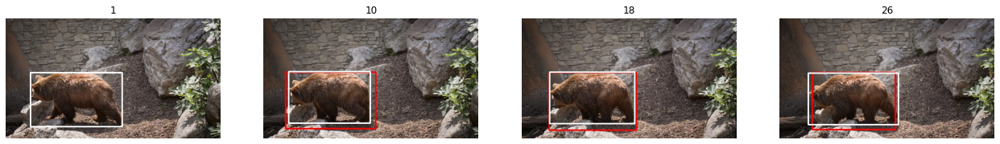

In [0]:
## GOTURN predictions with red rectangle
## Annotations with white rectangle
from skimage import io
plt.figure(figsize=(22, 6))
name = 'bear'
for idx, im in enumerate([1,10,18,26]):
    img_current = io.imread(path_out+name+'/%0*d.jpg'%(0,im))
    plt.subplot(1,4,idx+1), plt.title('%i' %(im)), plt.imshow(img_current), plt.xticks([]), plt.yticks([])
    plt.axis('off')
plt.show()

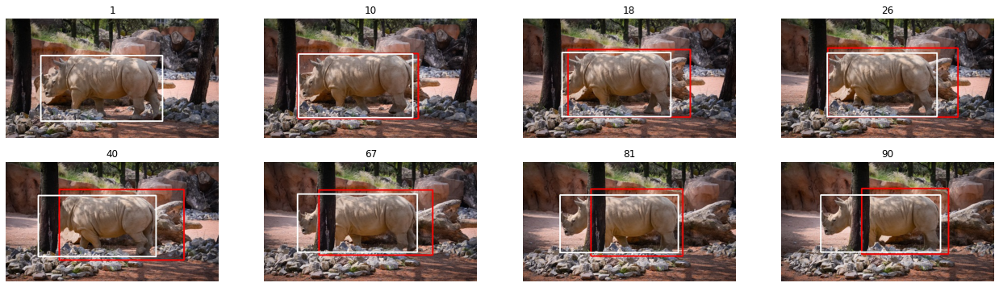

In [0]:
plt.figure(figsize=(22, 6))
name = 'rhino'
for idx, im in enumerate([1,10,18,26,40,67,81,90]):
    img_current = io.imread(path_out+name+'/%0*d.jpg'%(0,im))
    plt.subplot(2,4,idx+1), plt.title('%i' %(im)), plt.imshow(img_current), plt.xticks([]), plt.yticks([])
    plt.axis('off')
plt.show()

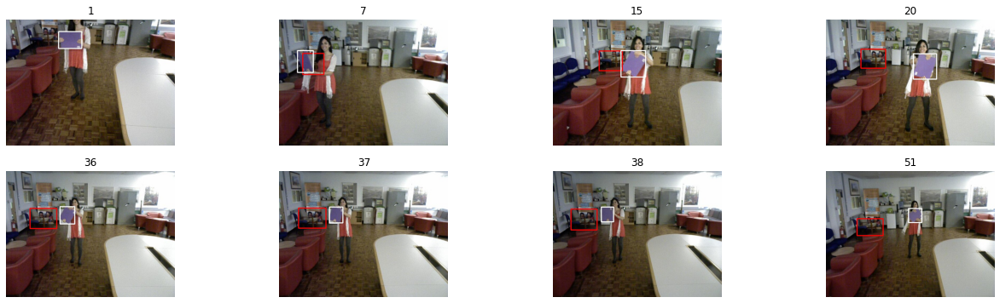

In [0]:
plt.figure(figsize=(22, 6))
name = 'book'
for idx, im in enumerate([1,7,15,20,36,37,38,51]):
    img_current = io.imread(path_out+name+'/%0*d.jpg'%(0,im))
    plt.subplot(2,4,idx+1), plt.title('%i' %(im)), plt.imshow(img_current), plt.xticks([]), plt.yticks([])
    plt.axis('off')
plt.show()

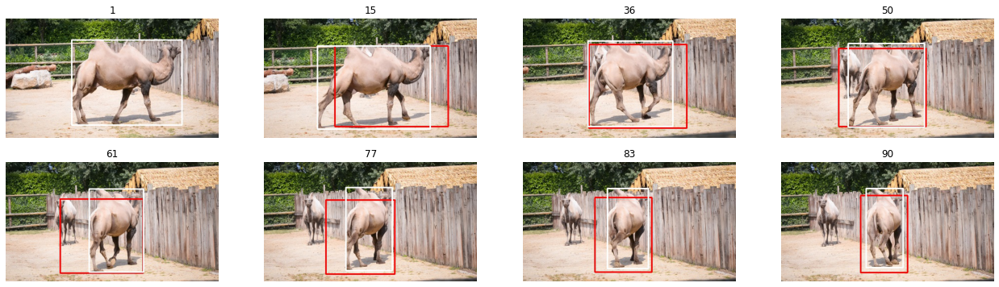

In [0]:
plt.figure(figsize=(22, 6))
name = 'camel'
for idx, im in enumerate([1,15,36,50,61,77,83,90]):
    img_current = io.imread(path_out+name+'/%0*d.jpg'%(0,im))
    plt.subplot(2,4,idx+1), plt.title('%i' %(im)), plt.imshow(img_current), plt.xticks([]), plt.yticks([])
    plt.axis('off')
plt.show()

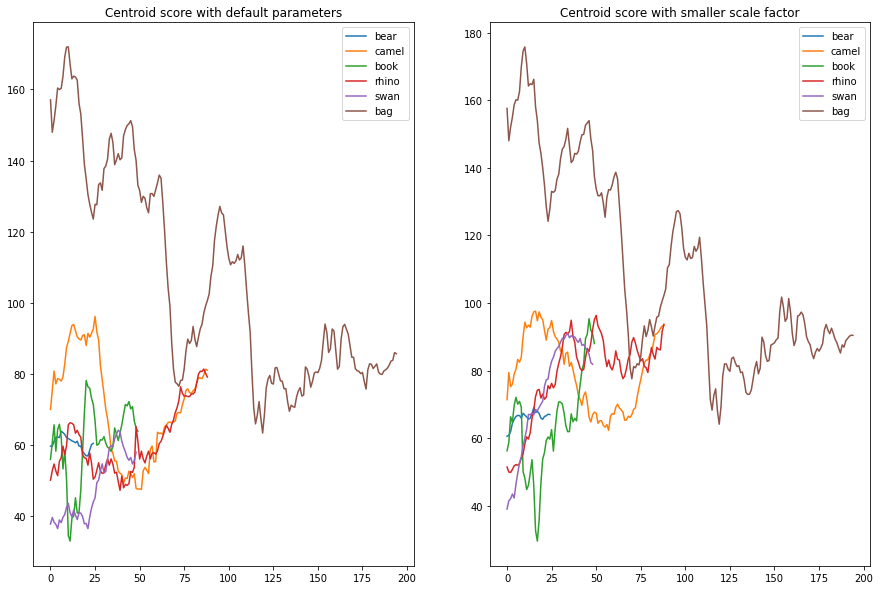

In [0]:
plt.figure(figsize = (15,10))
plt.subplot(121)
pickle_in = open(path+'/results/pretrained_default/cent_dict.pickle',"rb")
centroid_esti = pickle.load(pickle_in)
for n in names:
    gt_coords = open(path_in+n+'/groundtruth_rect.txt', "r")
    coords = gt_coords.readline().split(',')
    centroid_name = centroid_esti[n]
    dist = []
    for idx in range(len(centroid_name)):
        coords = gt_coords.readline().split(',')
        cenx = int(coords[0]) + (int(coords[2]) -int(coords[0]))/2
        ceny = int(coords[1]) + (int(coords[3]) -int(coords[1]))/2
        centroid_gt = [cenx,ceny]
        dist.append(centroid_assessment(centroid_gt,centroid_name[idx]))
    plt.plot(dist, label = n)
plt.legend()
plt.title("Centroid score with default parameters")

plt.subplot(122)
pickle_in = open(path_out+'/cent_dict.pickle',"rb")
centroid_esti = pickle.load(pickle_in)
for n in names:
    gt_coords = open(path_in+n+'/groundtruth_rect.txt', "r")
    coords = gt_coords.readline().split(',')
    centroid_name = centroid_esti[n]
    dist = []
    for idx in range(len(centroid_name)):
        coords = gt_coords.readline().split(',')
        cenx = int(coords[0]) + (int(coords[2]) -int(coords[0]))/2
        ceny = int(coords[1]) + (int(coords[3]) -int(coords[1]))/2
        centroid_gt = [cenx,ceny]
        dist.append(centroid_assessment(centroid_gt,centroid_name[idx]))
    plt.plot(dist, label = n)
plt.legend()
plt.title("Centroid score with smaller scale factor")
plt.show()

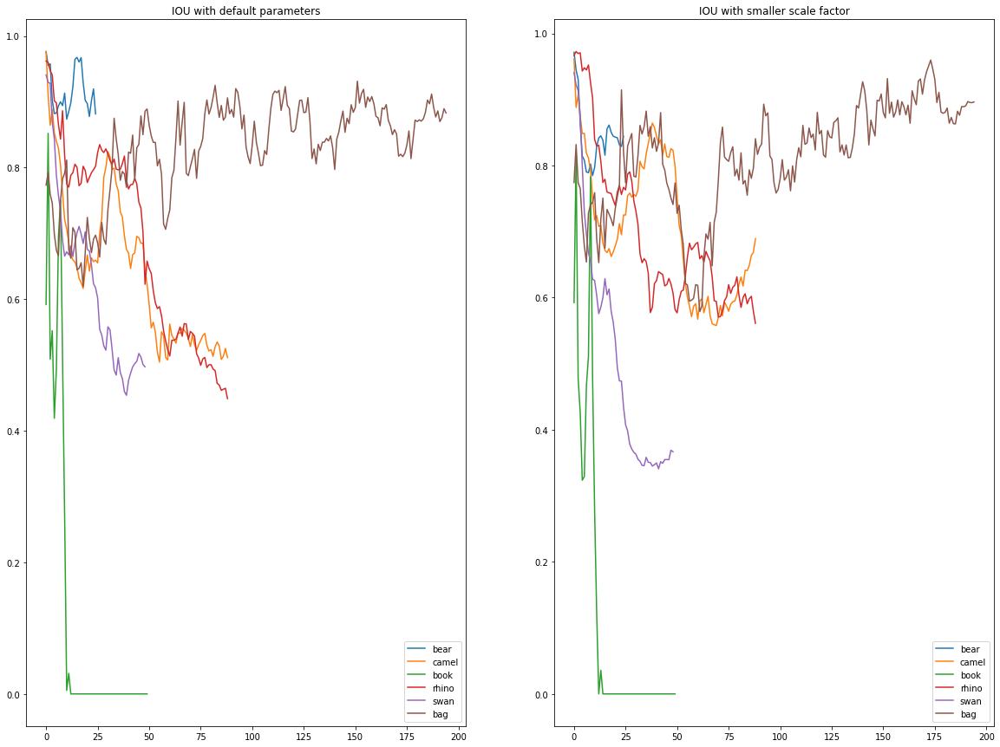

In [0]:
plt.figure(figsize = (20,15))
pickle_in = open(path+'/results/pretrained_default/iou_dict.pickle',"rb")
iou_score = pickle.load(pickle_in)
plt.subplot(121)
for n in names:
    iou_name = iou_score[n]
    plt.plot(iou_name, label = n)
plt.legend()
plt.title('IOU with default parameters')

plt.subplot(122)
pickle_in = open(path_out+'iou_dict.pickle',"rb")
iou_score = pickle.load(pickle_in)
for n in names:
    iou_name = iou_score[n]
    plt.plot(iou_name, label = n)
plt.legend()
plt.title('IOU with smaller scale factor')
plt.show()

**Conclusions :**

Reducing the scaling factor improve the results for "camel" sequences which represent an important change of scale but decrease the IOU score for other sequences.

# **Resume training the pretrained model using the traing sequences**

In [0]:
# necessary imports
import os
import sys
import time
import argparse

import torch
import torch.optim as optim
import numpy as np
import src.model

from src.datasets import TrainingSeq
from src.helper import (Rescale, shift_crop_training_sample,
                    crop_sample, NormalizeToTensor)

import pandas as pd

# constants
cuda = torch.cuda.is_available()
device = torch.device('cuda:0' if cuda else 'cpu')
input_size = 224
kSaveModel = 1000  # save model after every 20000 steps
batchSize = 50  # number of samples in a batch
kGeneratedExamplesPerImage = 10  # generate 10 synthetic samples per image
transform = NormalizeToTensor()
bb_params = {}
enable_tensorboard = False
if enable_tensorboard:
    from tensorboardX import SummaryWriter
    writer = SummaryWriter()

args = {'num_batches':10000, 'learning_rate':1e-6, 'gamma':0.1, 'momentum':0.9,
        'weight_decay':0.0005,'lr_decay_step':100000,'data_directory':'../data/',
        'save_directory':'/content/drive/My Drive/CompVis_Project/pygoturn-master/model2/', 'lambda_shift_frac':3,
        'lambda_scale_frac':15,'min_scale':-0.4,'max_scale':0.4, 'manual_seed':800,
        'resume':'/content/drive/My Drive/CompVis_Project/pygoturn-master/model/pytorch_goturn.pth.tar',
        'batch_size':50,'save_freq':20000}


def resumeTraining():

    global args, batchSize, kSaveModel, bb_params
    #args = parser.parse_args()
    print(args)
    batchSize = args['batch_size']
    kSaveModel = args['save_freq']
    np.random.seed(args['manual_seed'])
    torch.manual_seed(args['manual_seed'])
    if cuda:
        torch.cuda.manual_seed_all(args['manual_seed'])

    # load bounding box motion model params
    bb_params['lambda_shift_frac'] = args['lambda_shift_frac']
    bb_params['lambda_scale_frac'] = args['lambda_scale_frac']
    bb_params['min_scale'] = args['min_scale']
    bb_params['max_scale'] = args['max_scale']

    # load datasets
    # alov = ALOVDataset(os.path.join(args.data_directory,
    #                    'imagedata++/'),
    #                    os.path.join(args.data_directory,
    #                    'alov300++_rectangleAnnotation_full/'),
    #                    transform, input_size)
    # imagenet = ILSVRC2014_DET_Dataset(os.path.join(args.data_directory,
    #                                   'ILSVRC2014_DET_train/'),
    #                                   os.path.join(args.data_directory,
    #                                   'ILSVRC2014_DET_bbox_train/'),
    #                                   bb_params,
    #                                   transform,
    #                                   input_size)

    trainingSeq = TrainingSeq("",transform,input_size)


    # list of datasets to train on
    datasets = [trainingSeq]

    # load model
    net = src.model.GoNet().to(device)
    # summary(net, [(3, 224, 224), (3, 224, 224)])
    loss_fn = torch.nn.L1Loss(size_average=False).to(device)

    # initialize optimizer
    optimizer = optim.SGD(net.classifier.parameters(),
                          lr=args['learning_rate'],
                          momentum=args['momentum'],
                          weight_decay=args['weight_decay'])

    if os.path.exists(args['save_directory']):
        print('Directory %s already exists' % (args['save_directory']))
    else:
        os.makedirs(args['save_directory'])

    # start training
    net = train_model(net, datasets, loss_fn, optimizer)

    # save trained model
    checkpoint = {'state_dict': net.state_dict()}
    path = os.path.join(args['save_directory'], 'pytorch_goturn.pth.tar')
    torch.save(checkpoint, path)


def get_training_batch(num_running_batch, running_batch, dataset):
    '''
    Implements GOTURN batch formation regimen.
    '''
    global args, batchSize
    done = False
    N = kGeneratedExamplesPerImage+1
    train_batch = None
    x1_batch, x2_batch, y_batch = make_transformed_samples(dataset, args)
    assert(x1_batch.shape[0] == x2_batch.shape[0] == y_batch.shape[0] == N)
    count_in = min(batchSize - num_running_batch, N)
    remain = N - count_in
    running_batch['previmg'][num_running_batch:
                             num_running_batch+count_in] = x1_batch[:count_in]
    running_batch['currimg'][num_running_batch:
                             num_running_batch+count_in] = x2_batch[:count_in]
    running_batch['currbb'][num_running_batch:
                            num_running_batch+count_in] = y_batch[:count_in]
    num_running_batch = num_running_batch + count_in
    if remain > 0:
        done = True
        train_batch = running_batch.copy()
        running_batch['previmg'][:remain] = x1_batch[-remain:]
        running_batch['currimg'][:remain] = x2_batch[-remain:]
        running_batch['currbb'][:remain] = y_batch[-remain:]
        num_running_batch = remain
    return running_batch, train_batch, done, num_running_batch


def make_transformed_samples(dataset, args):
    '''
    Given a dataset, it picks a random sample from it and returns a batch
    of (kGeneratedExamplesPerImage+1) samples. The batch contains true sample
    from dataset and kGeneratedExamplesPerImage samples, which are created
    artifically with augmentation by GOTURN smooth motion model.
    '''
    idx = np.random.randint(dataset.len, size=1)[0]
    # unscaled original sample (single image and bb)
    orig_sample = dataset.get_orig_sample(idx)
    # cropped scaled sample (two frames and bb)
    true_sample, _ = dataset.get_sample(idx)
    true_tensor = transform(true_sample)
    x1_batch = torch.Tensor(kGeneratedExamplesPerImage + 1, 3,
                            input_size, input_size)
    x2_batch = torch.Tensor(kGeneratedExamplesPerImage + 1, 3,
                            input_size, input_size)
    y_batch = torch.Tensor(kGeneratedExamplesPerImage + 1, 4)

    # initialize batch with the true sample
    x1_batch[0] = true_tensor['previmg']
    x2_batch[0] = true_tensor['currimg']
    y_batch[0] = true_tensor['currbb']

    scale = Rescale((input_size, input_size))
    for i in range(kGeneratedExamplesPerImage):
        sample = orig_sample
        # unscaled current image crop with box
        curr_sample, opts_curr = shift_crop_training_sample(sample, bb_params)
        # unscaled previous image crop with box
        prev_sample, opts_prev = crop_sample(sample)
        scaled_curr_obj = scale(curr_sample, opts_curr)
        scaled_prev_obj = scale(prev_sample, opts_prev)
        training_sample = {'previmg': scaled_prev_obj['image'],
                           'currimg': scaled_curr_obj['image'],
                           'currbb': scaled_curr_obj['bb']}
        sample = transform(training_sample)
        x1_batch[i+1] = sample['previmg']
        x2_batch[i+1] = sample['currimg']
        y_batch[i+1] = sample['currbb']

    return x1_batch, x2_batch, y_batch


def train_model(model, datasets, criterion, optimizer):

    global args, writer
    since = time.time()
    curr_loss = 0
    lr = args['learning_rate']
    flag = False
    start_itr = 0
    num_running_batch = 0
    running_batch = {'previmg': torch.Tensor(batchSize, 3, input_size, input_size),
                     'currimg': torch.Tensor(batchSize, 3, input_size, input_size),
                     'currbb': torch.Tensor(batchSize, 4)}
    scheduler = optim.lr_scheduler.StepLR(optimizer,
                                          step_size=args['lr_decay_step'],
                                          gamma=args['gamma'])

    # resume from a checkpoint
    if args['resume']:
        print('Resuming training')
        if os.path.isfile(args['resume']):
            print("=> loading checkpoint '{}'".format(args['resume']))
            checkpoint = torch.load(args['resume'])
            #start_itr = checkpoint['itr']
            model.load_state_dict(checkpoint['state_dict'])
            #optimizer.load_state_dict(checkpoint['optimizer'])
            #scheduler.load_state_dict(checkpoint['scheduler'])
            #num_running_batch = checkpoint['num_running_batch']
            #running_batch = checkpoint['running_batch']
            #lr = checkpoint['lr']
            #np.random.set_state(checkpoint['np_rand_state'])
            #torch.set_rng_state(checkpoint['torch_rand_state'])
            #print("=> loaded checkpoint '{}' (iteration {})"
             #     .format(args['resume'], checkpoint['itr']))
            print("=> loaded checkpoint '{}'"
                  .format(args['resume']))

        else:
            print("=> no checkpoint found at '{}'".format(args['resume']))

    if not os.path.isdir(args['save_directory']):
        os.makedirs(args['save_directory'])

    itr = start_itr
    st = time.time()
    while itr < args['num_batches']:

        model.train()
        if (args['resume'] and os.path.isfile(args['resume']) and
           itr == start_itr and (not flag)):
            checkpoint = torch.load(args['resume'])
            i =0 # checkpoint['dataset_indx']
            flag = True
        else:
            i = 0

        # train on datasets
        # usually ALOV and ImageNet
        while i < len(datasets):
            dataset = datasets[i]
            i = i+1
            (running_batch, train_batch,
                done, num_running_batch) = get_training_batch(num_running_batch,
                                                              running_batch,
                                                              dataset)
            # print(i, num_running_batch, done)
            if done:
                scheduler.step()
                # load sample
                x1 = train_batch['previmg'].to(device)
                x2 = train_batch['currimg'].to(device)
                y = train_batch['currbb'].requires_grad_(False).to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                output = model(x1, x2)
                loss = criterion(output, y)

                # backward + optimize
                loss.backward()
                optimizer.step()

                # statistics
                curr_loss = loss.item()
                end = time.time()
                itr = itr + 1
                print('[training] step = %d/%d, loss = %f, time = %f'
                      % (itr, args['num_batches'], curr_loss, end-st))
                sys.stdout.flush()
                del(train_batch)
                st = time.time()

                if enable_tensorboard:
                    writer.add_scalar('train/batch_loss', curr_loss, itr)

                if itr > 0 and itr % kSaveModel == 0:
                    path = os.path.join(args['save_directory'],
                                        'model_itr_' + str(itr) + '_loss_' +
                                        str(round(curr_loss, 3)) + '.pth.tar')
                    save_checkpoint({'itr': itr,
                                     'np_rand_state': np.random.get_state(),
                                     'torch_rand_state': torch.get_rng_state(),
                                     'l1_loss': curr_loss,
                                     'state_dict': model.state_dict(),
                                     'optimizer': optimizer.state_dict(),
                                     'scheduler': scheduler.state_dict(),
                                     'num_running_batch': num_running_batch,
                                     'running_batch': running_batch,
                                     'lr': lr,
                                     'dataset_indx': i}, path)

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    if enable_tensorboard:
        writer.export_scalars_to_json("./all_scalars.json")
        writer.close()
    return model


def save_checkpoint(state, filename='checkpoint.pth.tar'):
    torch.save(state, filename)


resumeTraining()

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
[training] step = 5003/10000, loss = 37.839714, time = 0.298130
[training] step = 5004/10000, loss = 33.290394, time = 0.343558
[training] step = 5005/10000, loss = 53.949532, time = 0.367152
[training] step = 5006/10000, loss = 73.298073, time = 0.288836
[training] step = 5007/10000, loss = 63.484951, time = 0.340769
[training] step = 5008/10000, loss = 43.352859, time = 0.308682
[training] step = 5009/10000, loss = 33.202171, time = 0.348287
[training] step = 5010/10000, loss = 47.013931, time = 0.291043
[training] step = 5011/10000, loss = 56.570393, time = 0.343803
[training] step = 5012/10000, loss = 40.734901, time = 0.280141
[training] step = 5013/10000, loss = 45.006691, time = 0.333702
[training] step = 5014/10000, loss = 44.044086, time = 0.242357
[training] step = 5015/10000, loss = 54.719261, time = 0.323544
[training] step = 5016/10000, loss = 37.185722, time = 0.341844
[training] step = 5017/100

# **Testing the new model on test sequences**

## Old (pretrained) model on test sequences :

In [0]:
names = ['cows','fish','octopus']
path_in = path+"/data/OTB/"
path_out = path+"/results/pretrained_testSeq/"
model_weights = path+"/model/pytorch_goturn.pth.tar"


getPredictions(path_in,path_out,model_weights,names)

cows
[110.  64. 310. 197.]
frame: 2, IoU = 0.960550
frame: 3, IoU = 0.941642
frame: 4, IoU = 0.936697
frame: 5, IoU = 0.914464
frame: 6, IoU = 0.913235
frame: 7, IoU = 0.911851
frame: 8, IoU = 0.918284
frame: 9, IoU = 0.923619
frame: 10, IoU = 0.920662
frame: 11, IoU = 0.917345
frame: 12, IoU = 0.922306
frame: 13, IoU = 0.925884
frame: 14, IoU = 0.933846
frame: 15, IoU = 0.921791
frame: 16, IoU = 0.907433
frame: 17, IoU = 0.900338
frame: 18, IoU = 0.928243
frame: 19, IoU = 0.942491
frame: 20, IoU = 0.922510
frame: 21, IoU = 0.908131
frame: 22, IoU = 0.916126
frame: 23, IoU = 0.907177
frame: 24, IoU = 0.882431
frame: 25, IoU = 0.903467
frame: 26, IoU = 0.898987
frame: 27, IoU = 0.858787
frame: 28, IoU = 0.841362
frame: 29, IoU = 0.810109
frame: 30, IoU = 0.793014
frame: 31, IoU = 0.778123
frame: 32, IoU = 0.779560
frame: 33, IoU = 0.789949
frame: 34, IoU = 0.778955
frame: 35, IoU = 0.759980
frame: 36, IoU = 0.735980
frame: 37, IoU = 0.723492
frame: 38, IoU = 0.715523
frame: 39, IoU = 0.

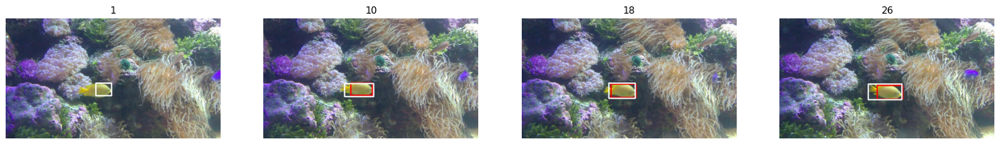

In [0]:
plt.figure(figsize=(22, 6))
name = 'fish'
for idx, im in enumerate([1,10,18,26]):
    img_current = io.imread(path_out+name+'/%0*d.jpg'%(0,im))
    plt.subplot(1,4,idx+1), plt.title('%i' %(im)), plt.imshow(img_current), plt.xticks([]), plt.yticks([])
    plt.axis('off')
plt.show()

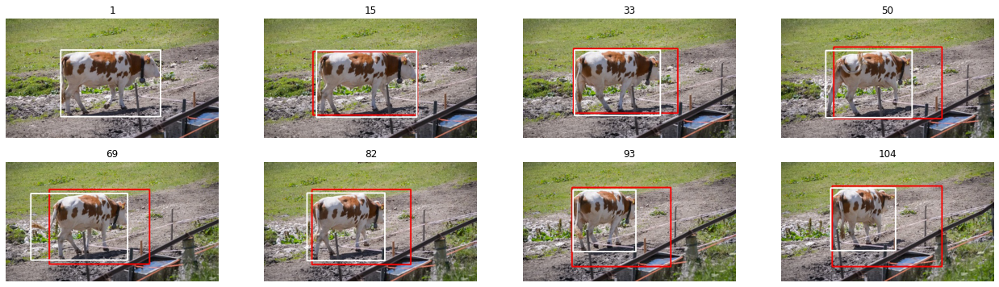

In [0]:
plt.figure(figsize=(22, 6))
name = 'cows'
for idx, im in enumerate([1,15,33,50,69,82,93,104]):
    img_current = io.imread(path_out+name+'/%0*d.jpg'%(0,im))
    plt.subplot(2,4,idx+1), plt.title('%i' %(im)), plt.imshow(img_current), plt.xticks([]), plt.yticks([])
    plt.axis('off')
plt.show()

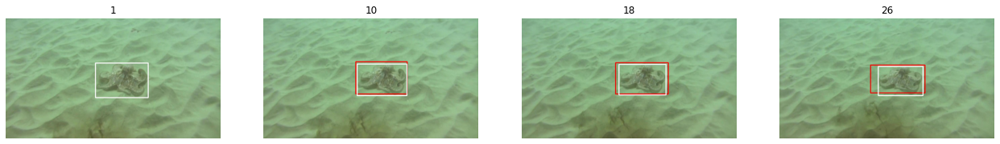

In [0]:
plt.figure(figsize=(22, 6))
name = 'octopus'
for idx, im in enumerate([1,10,18,26]):
    img_current = io.imread(path_out+name+'/%0*d.jpg'%(0,im))
    plt.subplot(1,4,idx+1), plt.title('%i' %(im)), plt.imshow(img_current), plt.xticks([]), plt.yticks([])
    plt.axis('off')
plt.show()

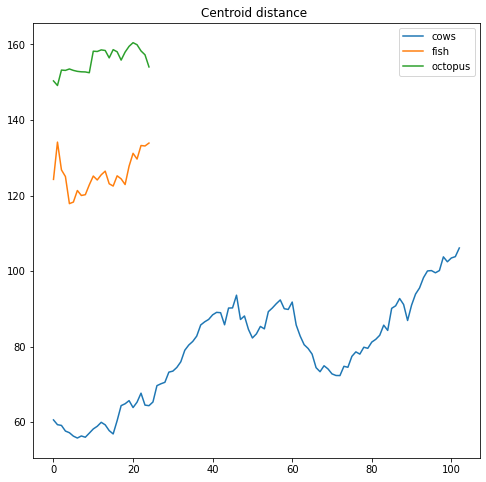

In [0]:
plt.figure(figsize = (8,8))

pickle_in = open(path_out+'/cent_dict.pickle',"rb")
centroid_esti = pickle.load(pickle_in)
for n in names:
    gt_coords = open(path_in+n+'/groundtruth_rect.txt', "r")
    coords = gt_coords.readline().split(',')
    centroid_name = centroid_esti[n]
    dist = []
    for idx in range(len(centroid_name)):
        coords = gt_coords.readline().split(',')
        cenx = int(coords[0]) + (int(coords[2]) -int(coords[0]))/2
        ceny = int(coords[1]) + (int(coords[3]) -int(coords[1]))/2
        centroid_gt = [cenx,ceny]
        dist.append(centroid_assessment(centroid_gt,centroid_name[idx]))
    plt.plot(dist, label = n)
plt.legend()
plt.title("Centroid distance ")
plt.show()

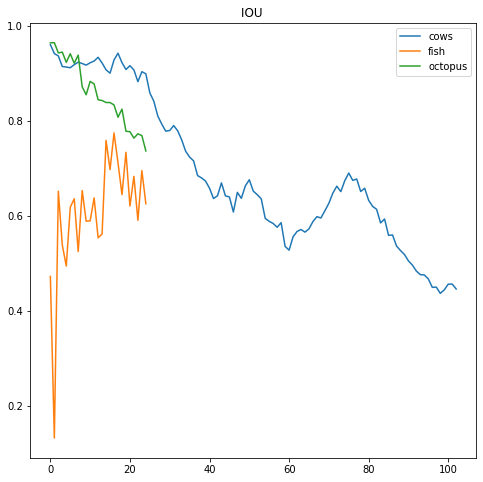

In [0]:
plt.figure(figsize = (8,8))

pickle_in = open(path_out+'iou_dict.pickle',"rb")
iou_score = pickle.load(pickle_in)
for n in names:
    iou_name = iou_score[n]
    plt.plot(iou_name, label = n)
plt.legend()
plt.title('IOU ')
plt.show()

## New (retrained) model on test sequences

In [0]:
names = ['cows','fish','octopus']
path_in = path+"/data/OTB/"
path_out = path+"/results/newModel_testSeq/"
model_weights = path+"/model2/pytorch_goturn.pth.tar"


getPredictions(path_in,path_out,model_weights,names)

cows
[110.  64. 310. 197.]
frame: 2, IoU = 0.971772
frame: 3, IoU = 0.985444
frame: 4, IoU = 0.982238
frame: 5, IoU = 0.967457
frame: 6, IoU = 0.953092
frame: 7, IoU = 0.952923
frame: 8, IoU = 0.929793
frame: 9, IoU = 0.949722
frame: 10, IoU = 0.935389
frame: 11, IoU = 0.948127
frame: 12, IoU = 0.949799
frame: 13, IoU = 0.947551
frame: 14, IoU = 0.953053
frame: 15, IoU = 0.960474
frame: 16, IoU = 0.968477
frame: 17, IoU = 0.949720
frame: 18, IoU = 0.936357
frame: 19, IoU = 0.930767
frame: 20, IoU = 0.931175
frame: 21, IoU = 0.924022
frame: 22, IoU = 0.926550
frame: 23, IoU = 0.927396
frame: 24, IoU = 0.935110
frame: 25, IoU = 0.940801
frame: 26, IoU = 0.947443
frame: 27, IoU = 0.963570
frame: 28, IoU = 0.949284
frame: 29, IoU = 0.958042
frame: 30, IoU = 0.954419
frame: 31, IoU = 0.966583
frame: 32, IoU = 0.950284
frame: 33, IoU = 0.954282
frame: 34, IoU = 0.963076
frame: 35, IoU = 0.960967
frame: 36, IoU = 0.961444
frame: 37, IoU = 0.952893
frame: 38, IoU = 0.954138
frame: 39, IoU = 0.

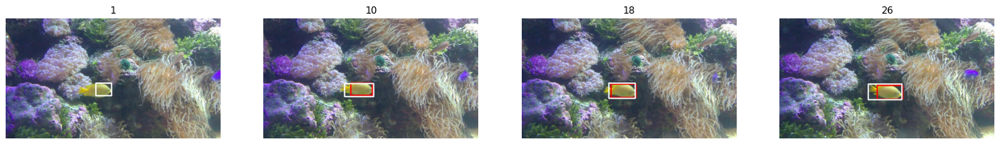

In [0]:
plt.figure(figsize=(22, 6))
name = 'fish'
for idx, im in enumerate([1,10,18,26]):
    img_current = io.imread(path_out+name+'/%0*d.jpg'%(0,im))
    plt.subplot(1,4,idx+1), plt.title('%i' %(im)), plt.imshow(img_current), plt.xticks([]), plt.yticks([])
    plt.axis('off')
plt.show()

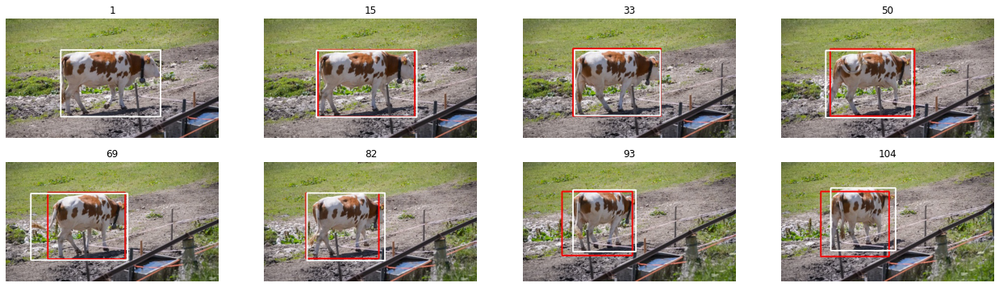

In [0]:
plt.figure(figsize=(22, 6))
name = 'cows'
for idx, im in enumerate([1,15,33,50,69,82,93,104]):
    img_current = io.imread(path_out+name+'/%0*d.jpg'%(0,im))
    plt.subplot(2,4,idx+1), plt.title('%i' %(im)), plt.imshow(img_current), plt.xticks([]), plt.yticks([])
    plt.axis('off')
plt.show()

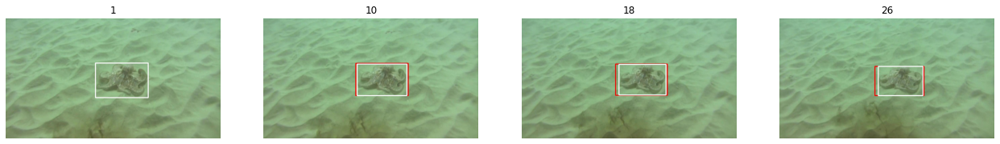

In [0]:

plt.figure(figsize=(22, 6))
name = 'octopus'
for idx, im in enumerate([1,10,18,26]):
    img_current = io.imread(path_out+name+'/%0*d.jpg'%(0,im))
    plt.subplot(1,4,idx+1), plt.title('%i' %(im)), plt.imshow(img_current), plt.xticks([]), plt.yticks([])
    plt.axis('off')
plt.show()

## Comparison

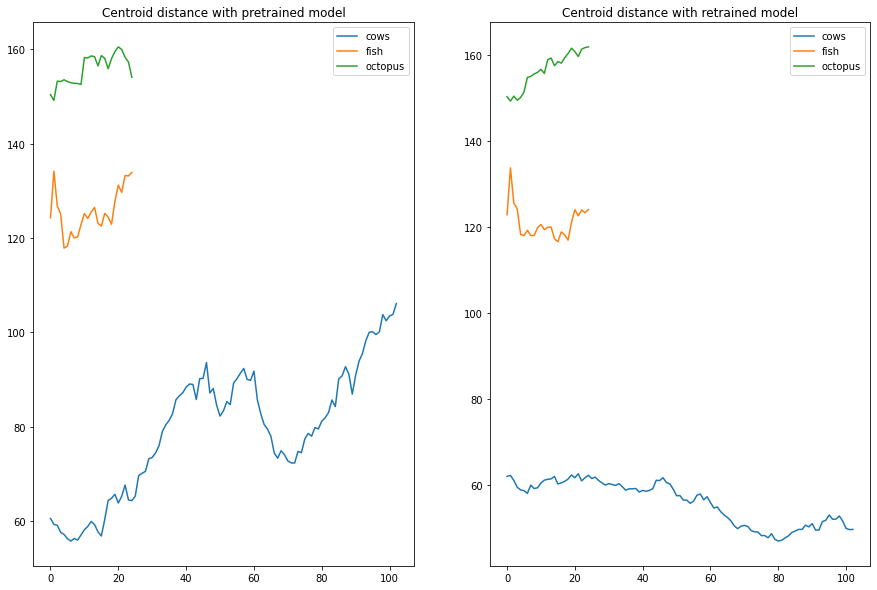

In [0]:
plt.figure(figsize = (15,10))
plt.subplot(121)
pickle_in = open(path+'/results/pretrained_testSeq/cent_dict.pickle',"rb")
centroid_esti = pickle.load(pickle_in)
for n in names:
    gt_coords = open(path_in+n+'/groundtruth_rect.txt', "r")
    coords = gt_coords.readline().split(',')
    centroid_name = centroid_esti[n]
    dist = []
    for idx in range(len(centroid_name)):
        coords = gt_coords.readline().split(',')
        cenx = int(coords[0]) + (int(coords[2]) -int(coords[0]))/2
        ceny = int(coords[1]) + (int(coords[3]) -int(coords[1]))/2
        centroid_gt = [cenx,ceny]
        dist.append(centroid_assessment(centroid_gt,centroid_name[idx]))
    plt.plot(dist, label = n)
plt.legend()
plt.title("Centroid distance with pretrained model")

plt.subplot(122)
pickle_in = open(path_out+'/cent_dict.pickle',"rb")
centroid_esti = pickle.load(pickle_in)
for n in names:
    gt_coords = open(path_in+n+'/groundtruth_rect.txt', "r")
    coords = gt_coords.readline().split(',')
    centroid_name = centroid_esti[n]
    dist = []
    for idx in range(len(centroid_name)):
        coords = gt_coords.readline().split(',')
        cenx = int(coords[0]) + (int(coords[2]) -int(coords[0]))/2
        ceny = int(coords[1]) + (int(coords[3]) -int(coords[1]))/2
        centroid_gt = [cenx,ceny]
        dist.append(centroid_assessment(centroid_gt,centroid_name[idx]))
    plt.plot(dist, label = n)
plt.legend()
plt.title("Centroid distance with retrained model")
plt.show()

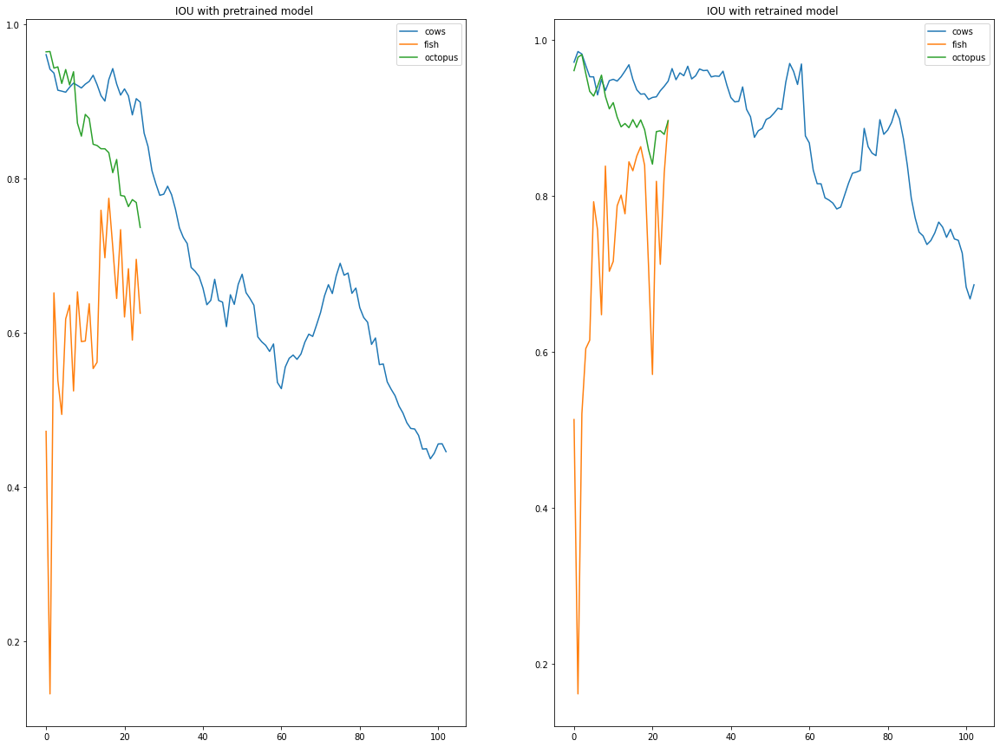

In [0]:
plt.figure(figsize = (20,15))
pickle_in = open(path+'/results/pretrained_testSeq/iou_dict.pickle',"rb")
iou_score = pickle.load(pickle_in)
plt.subplot(121)
for n in names:
    iou_name = iou_score[n]
    plt.plot(iou_name, label = n)
plt.legend()
plt.title('IOU with pretrained model ')

plt.subplot(122)
pickle_in = open(path_out+'/iou_dict.pickle',"rb")
iou_score = pickle.load(pickle_in)
for n in names:
    iou_name = iou_score[n]
    plt.plot(iou_name, label = n)
plt.legend()
plt.title('IOU with retrained model ')
plt.show()



**Conclusions :**
Resume training with the provided training seqences improve the results on the test sequences.

# Retraining the pretrained model : changing the laplace distribution parameters

In [0]:
args['save_directory'] = '/content/drive/My Drive/CompVis_Project/pygoturn-master/model4/'
args['lambda_shift_frac'] = 2
args['lambda_scale_frac']=10
args['min_scale':-0.7]
args['max_scale']=0.7
resumeTraining()

In [25]:
names = ['cows','fish','octopus']
path_in = path+"/data/OTB/"
path_out = path+"/results/newModel_laplace10/"
model_weights = path+"/model3/pytorch_goturn.pth.tar"


getPredictions(path_in,path_out,model_weights,names)

cows
[110.  64. 310. 197.]
frame: 2, IoU = 0.970984
frame: 3, IoU = 0.959104
frame: 4, IoU = 0.938112
frame: 5, IoU = 0.915357
frame: 6, IoU = 0.932145
frame: 7, IoU = 0.914552
frame: 8, IoU = 0.891539
frame: 9, IoU = 0.895042
frame: 10, IoU = 0.902582
frame: 11, IoU = 0.906845
frame: 12, IoU = 0.887041
frame: 13, IoU = 0.885710
frame: 14, IoU = 0.894748
frame: 15, IoU = 0.897835
frame: 16, IoU = 0.897994
frame: 17, IoU = 0.896716
frame: 18, IoU = 0.876499
frame: 19, IoU = 0.869924
frame: 20, IoU = 0.870741
frame: 21, IoU = 0.872876
frame: 22, IoU = 0.869454
frame: 23, IoU = 0.871343
frame: 24, IoU = 0.866051
frame: 25, IoU = 0.878277
frame: 26, IoU = 0.892099
frame: 27, IoU = 0.914063
frame: 28, IoU = 0.940630
frame: 29, IoU = 0.950913
frame: 30, IoU = 0.939988
frame: 31, IoU = 0.934533
frame: 32, IoU = 0.946150
frame: 33, IoU = 0.935372
frame: 34, IoU = 0.934692
frame: 35, IoU = 0.941842
frame: 36, IoU = 0.935343
frame: 37, IoU = 0.927947
frame: 38, IoU = 0.908854
frame: 39, IoU = 0.

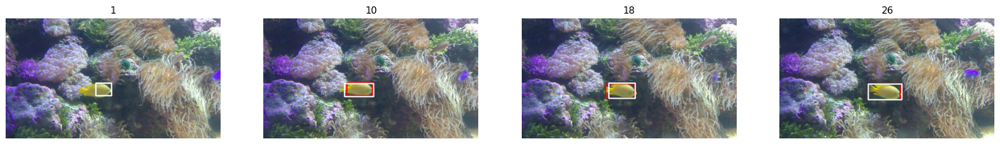

In [29]:
plt.figure(figsize=(22, 6))
name = 'fish'
for idx, im in enumerate([1,10,18,26]):
    img_current = io.imread(path_out+name+'/%0*d.jpg'%(0,im))
    plt.subplot(1,4,idx+1), plt.title('%i' %(im)), plt.imshow(img_current), plt.xticks([]), plt.yticks([])
    plt.axis('off')
plt.show()

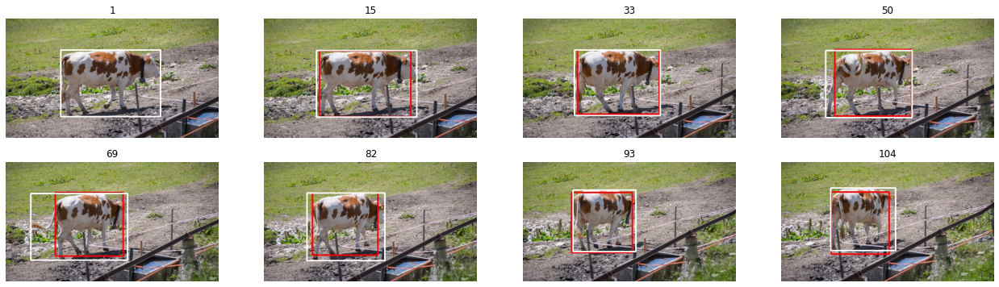

In [30]:
plt.figure(figsize=(22, 6))
name = 'cows'
for idx, im in enumerate([1,15,33,50,69,82,93,104]):
    img_current = io.imread(path_out+name+'/%0*d.jpg'%(0,im))
    plt.subplot(2,4,idx+1), plt.title('%i' %(im)), plt.imshow(img_current), plt.xticks([]), plt.yticks([])
    plt.axis('off')
plt.show()

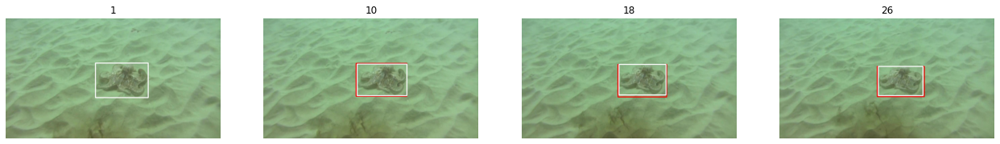

In [31]:

plt.figure(figsize=(22, 6))
name = 'octopus'
for idx, im in enumerate([1,10,18,26]):
    img_current = io.imread(path_out+name+'/%0*d.jpg'%(0,im))
    plt.subplot(1,4,idx+1), plt.title('%i' %(im)), plt.imshow(img_current), plt.xticks([]), plt.yticks([])
    plt.axis('off')
plt.show()

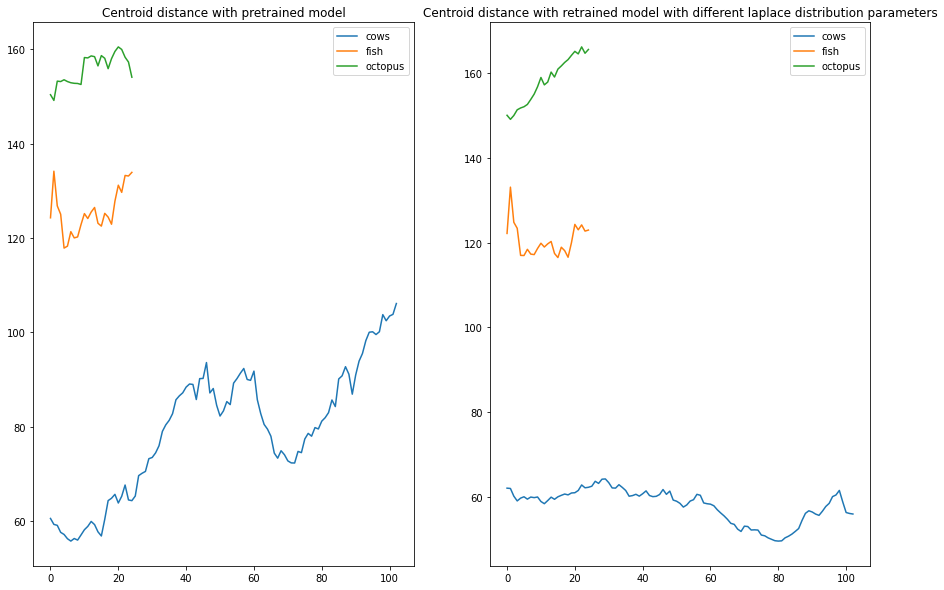

In [32]:
plt.figure(figsize = (15,10))
plt.subplot(121)
pickle_in = open(path+'/results/pretrained_testSeq/cent_dict.pickle',"rb")
centroid_esti = pickle.load(pickle_in)
for n in names:
    gt_coords = open(path_in+n+'/groundtruth_rect.txt', "r")
    coords = gt_coords.readline().split(',')
    centroid_name = centroid_esti[n]
    dist = []
    for idx in range(len(centroid_name)):
        coords = gt_coords.readline().split(',')
        cenx = int(coords[0]) + (int(coords[2]) -int(coords[0]))/2
        ceny = int(coords[1]) + (int(coords[3]) -int(coords[1]))/2
        centroid_gt = [cenx,ceny]
        dist.append(centroid_assessment(centroid_gt,centroid_name[idx]))
    plt.plot(dist, label = n)
plt.legend()
plt.title("Centroid distance with pretrained model")

plt.subplot(122)
pickle_in = open(path_out+'/cent_dict.pickle',"rb")
centroid_esti = pickle.load(pickle_in)
for n in names:
    gt_coords = open(path_in+n+'/groundtruth_rect.txt', "r")
    coords = gt_coords.readline().split(',')
    centroid_name = centroid_esti[n]
    dist = []
    for idx in range(len(centroid_name)):
        coords = gt_coords.readline().split(',')
        cenx = int(coords[0]) + (int(coords[2]) -int(coords[0]))/2
        ceny = int(coords[1]) + (int(coords[3]) -int(coords[1]))/2
        centroid_gt = [cenx,ceny]
        dist.append(centroid_assessment(centroid_gt,centroid_name[idx]))
    plt.plot(dist, label = n)
plt.legend()
plt.title("Centroid distance with retrained model with different laplace distribution parameters")
plt.show()

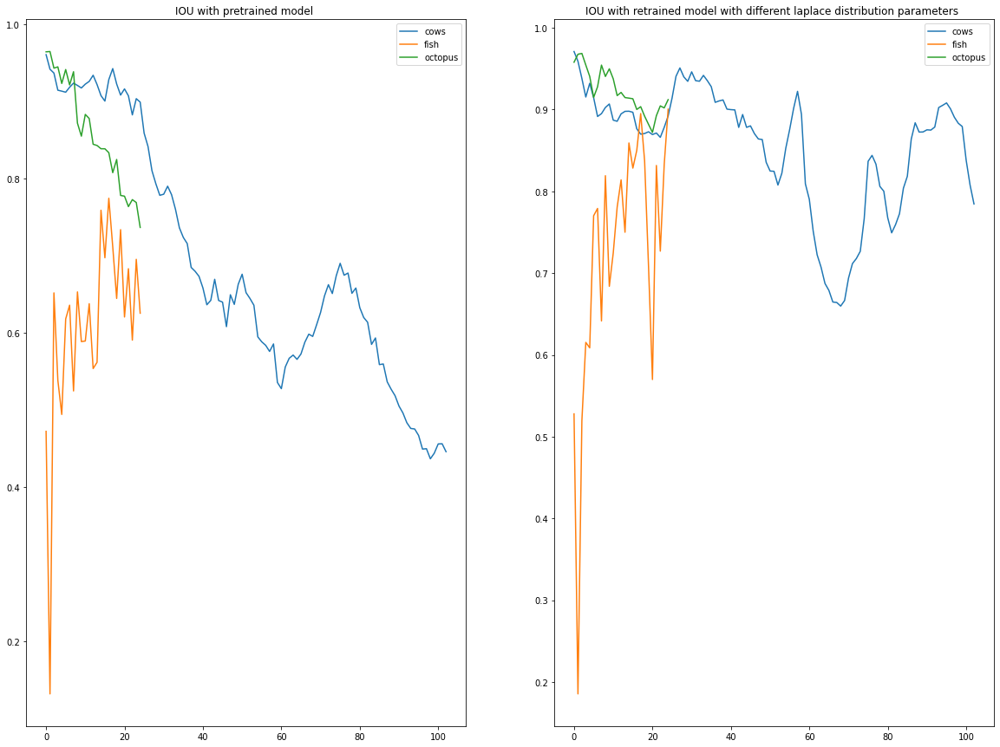

In [33]:
plt.figure(figsize = (20,15))
pickle_in = open(path+'/results/pretrained_testSeq/iou_dict.pickle',"rb")
iou_score = pickle.load(pickle_in)
plt.subplot(121)
for n in names:
    iou_name = iou_score[n]
    plt.plot(iou_name, label = n)
plt.legend()
plt.title('IOU with pretrained model ')

plt.subplot(122)
pickle_in = open(path_out+'/iou_dict.pickle',"rb")
iou_score = pickle.load(pickle_in)
for n in names:
    iou_name = iou_score[n]
    plt.plot(iou_name, label = n)
plt.legend()
plt.title('IOU with retrained model with different laplace distribution parameters ')
plt.show()



**Conclusions :**

Changing the parameters of laplace distribution in order to accept larger movement improves the results especially for "cows" sequence.

# **Save sequences as gif**

In [0]:
import imageio
def create_gif(filenames,output_file):
    images = []
    for filename in filenames:
        images.append(imageio.imread(filename))
    imageio.mimsave(output_file, images)
images = glob.glob(path+'/results/newModel_testSeq/octopus/*.jpg')


In [0]:
create_gif(images,'new_octopus.gif')